<a href="https://colab.research.google.com/github/MrBokl/np2022/blob/main/LR6/LR6.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Лабораторна робота №6

студента групи Анд-31

Майданик Андрій 

Варіант №7

In [1]:
import zipfile

# Download zip file of pizza_steak images
!wget https://storage.googleapis.com/ztm_tf_course/food_vision/101_food_classes_10_percent.zip

# Unzip the downloaded file
zip_ref = zipfile.ZipFile("101_food_classes_10_percent.zip", "r")
zip_ref.extractall()
zip_ref.close()

--2022-06-05 18:28:42--  https://storage.googleapis.com/ztm_tf_course/food_vision/101_food_classes_10_percent.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 172.217.164.176, 142.250.65.80, 142.251.33.208, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|172.217.164.176|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1625420029 (1.5G) [application/zip]
Saving to: ‘101_food_classes_10_percent.zip’

101_food_classes_10 100%[===================>]   1.51G   209MB/s    in 6.9s    

2022-06-05 18:28:49 (225 MB/s) - ‘101_food_classes_10_percent.zip’ saved [1625420029/1625420029]



In [2]:
#Coose the type of food according to the variant
import pathlib
import numpy as np
arr_index = [6, 36, 66]
data_dir_train = pathlib.Path("101_food_classes_10_percent/train/") # turn our training path into a Python path
class_names = np.array(sorted([item.name for item in data_dir_train.glob('*')])) # created a list of class_names from the subdirectories
my_class_names = [class_names[arr_index[0]], class_names[arr_index[1]],class_names[arr_index[2]]]
print('Our classes:', my_class_names)

Our classes: ['beignets', 'falafel', 'nachos']


In [3]:
from pathlib import Path
import shutil
import os
data_dir_test = pathlib.Path("101_food_classes_10_percent/test/")

#Delet all classese xcept specified
for name in class_names:
  if name != my_class_names[0] and name != my_class_names[1] and name != my_class_names[2]:
    dirpath_train = Path(data_dir_train) / name
    dirpath_test = Path(data_dir_test) / name
    if dirpath_test.exists() and dirpath_test.is_dir():
        shutil.rmtree(dirpath_train)
        shutil.rmtree(dirpath_test)
print('Test:', os.listdir(data_dir_test))
print('Train:', os.listdir(data_dir_train))

Test: ['beignets', 'falafel', 'nachos']
Train: ['beignets', 'falafel', 'nachos']


In [4]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

tf.random.set_seed(42)

# Normalize data 
train_datagen = ImageDataGenerator(rescale=1./255)
valid_datagen = ImageDataGenerator(rescale=1./255)

# Setup the train and test directories(our folders are confused)
train_dir = "101_food_classes_10_percent/test/"
test_dir = "101_food_classes_10_percent/train/"

In [5]:
# Import data from directories and turn it into batches
train_data = train_datagen.flow_from_directory(train_dir,
                                               batch_size=32, # number of images to process at a time 
                                               target_size=(224, 224),
                                               class_mode="categorical",
                                               seed=42)

valid_data = valid_datagen.flow_from_directory(test_dir,
                                               batch_size=32,
                                               target_size=(224, 224),
                                               class_mode="categorical",
                                               seed=42)

Found 750 images belonging to 3 classes.
Found 225 images belonging to 3 classes.


# Завдання 1

Виконати вирішення задачі класифікації для 3 класів з набору даних food101 з використанням різних моделей нейронних мереж:

CNN модель з лабораторної роботи 4

In [7]:
# Create a CNN model
from keras.callbacks import TensorBoard 
model_1 = tf.keras.models.Sequential([
  tf.keras.layers.Conv2D(10, 3, activation='relu', input_shape=(224, 224, 3)),
  tf.keras.layers.MaxPool2D(),
  tf.keras.layers.MaxPool2D(),
  tf.keras.layers.Conv2D(10, 3, activation='relu'), 
  tf.keras.layers.MaxPool2D(),
  tf.keras.layers.MaxPool2D(),
  tf.keras.layers.Conv2D(10, 3, activation='relu'),
  tf.keras.layers.Dense(32),
  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(3, activation="softmax")
  ])

model_1.compile(loss='categorical_crossentropy',
              optimizer=tf.keras.optimizers.Adam(),
              metrics=["accuracy"])


tensorboard_1 = TensorBoard(log_dir='logs/cnn(adam)', histogram_freq=1,
                          write_graph=True, write_images=False)

history_1 = model_1.fit(train_data,
                        epochs=10,
                        steps_per_epoch=len(train_data),
                        validation_data=valid_data,
                        validation_steps=len(valid_data),
                        callbacks=[tensorboard_1])

Epoch 1/10
24/24 [==============================] - 17s 222ms/step - loss: 1.0439 - accuracy: 0.4480 - val_loss: 0.9247 - val_accuracy: 0.5600
Epoch 2/10
24/24 [==============================] - 5s 199ms/step - loss: 0.8148 - accuracy: 0.6267 - val_loss: 0.9520 - val_accuracy: 0.5644
Epoch 3/10
24/24 [==============================] - 4s 185ms/step - loss: 0.7315 - accuracy: 0.6867 - val_loss: 0.9066 - val_accuracy: 0.5822
Epoch 4/10
24/24 [==============================] - 4s 185ms/step - loss: 0.6999 - accuracy: 0.7013 - val_loss: 0.8444 - val_accuracy: 0.5778
Epoch 5/10
24/24 [==============================] - 4s 185ms/step - loss: 0.6686 - accuracy: 0.7187 - val_loss: 0.8346 - val_accuracy: 0.5822
Epoch 6/10
24/24 [==============================] - 4s 185ms/step - loss: 0.6405 - accuracy: 0.7307 - val_loss: 0.8141 - val_accuracy: 0.5956
Epoch 7/10
24/24 [==============================] - 4s 184ms/step - loss: 0.6120 - accuracy: 0.7480 - val_loss: 0.9388 - val_accuracy: 0.6133
Epoch

# Завдання 2

Resnet модель(Adam)

In [8]:
#Resenet(Adam)
import tensorflow_hub as hub
from keras.callbacks import TensorBoard

model_2 = tf.keras.Sequential([
    hub.KerasLayer("https://tfhub.dev/google/imagenet/resnet_v1_101/feature_vector/5",
                   trainable=False),  # Can be True, see below.
    tf.keras.layers.Dense(3, activation='softmax')
])
model_2.build([None, 224, 224, 3])  # Batch input shape.

model_2.compile(loss="categorical_crossentropy",
              optimizer=tf.keras.optimizers.Adam(),
              metrics=["accuracy"])

tensorboard_2 = TensorBoard(log_dir='logs/resnet(adam)', histogram_freq=1,
                          write_graph=True, write_images=False)

history_model_2 = model_2.fit(train_data,
                          epochs=10,
                          steps_per_epoch=len(train_data),
                          validation_data=valid_data,
                          validation_steps=len(valid_data),
                          callbacks=[tensorboard_2])

Epoch 1/10
24/24 [==============================] - 25s 695ms/step - loss: 0.9354 - accuracy: 0.6093 - val_loss: 0.6126 - val_accuracy: 0.7644
Epoch 2/10
24/24 [==============================] - 15s 622ms/step - loss: 0.3134 - accuracy: 0.8773 - val_loss: 0.4713 - val_accuracy: 0.8222
Epoch 3/10
24/24 [==============================] - 15s 638ms/step - loss: 0.2313 - accuracy: 0.9213 - val_loss: 0.4032 - val_accuracy: 0.8622
Epoch 4/10
24/24 [==============================] - 14s 617ms/step - loss: 0.1722 - accuracy: 0.9413 - val_loss: 0.4167 - val_accuracy: 0.8578
Epoch 5/10
24/24 [==============================] - 15s 618ms/step - loss: 0.1509 - accuracy: 0.9440 - val_loss: 0.4042 - val_accuracy: 0.8533
Epoch 6/10
24/24 [==============================] - 15s 652ms/step - loss: 0.1227 - accuracy: 0.9613 - val_loss: 0.3622 - val_accuracy: 0.8667
Epoch 7/10
24/24 [==============================] - 14s 609ms/step - loss: 0.0993 - accuracy: 0.9747 - val_loss: 0.3241 - val_accuracy: 0.8756

# Завдання 2.2

Efficientnet модель(Adam)



In [9]:
#Efficientnet(Adam)
model_3 = tf.keras.Sequential([
    hub.KerasLayer("https://tfhub.dev/tensorflow/efficientnet/b0/feature-vector/1",
                   trainable=False),  # Can be True, see below.
    tf.keras.layers.Dense(3, activation='softmax')
])
model_3.build([None, 224, 224, 3])  # Batch input shape.

model_3.compile(loss="categorical_crossentropy",
              optimizer=tf.keras.optimizers.Adam(),
              metrics=["accuracy"])

tensorboard_3 = TensorBoard(log_dir='logs/efficientnet(adam)', histogram_freq=1,
                          write_graph=True, write_images=False)

history_model_3 = model_3.fit(train_data,
                          epochs=10,
                          steps_per_epoch=len(train_data),
                          validation_data=valid_data,
                          validation_steps=len(valid_data),
                          callbacks=[tensorboard_3])

Epoch 1/10
24/24 [==============================] - 18s 350ms/step - loss: 0.6176 - accuracy: 0.8133 - val_loss: 0.4674 - val_accuracy: 0.8400
Epoch 2/10
24/24 [==============================] - 7s 273ms/step - loss: 0.2970 - accuracy: 0.9347 - val_loss: 0.3720 - val_accuracy: 0.8533
Epoch 3/10
24/24 [==============================] - 6s 271ms/step - loss: 0.2161 - accuracy: 0.9507 - val_loss: 0.3189 - val_accuracy: 0.8711
Epoch 4/10
24/24 [==============================] - 7s 277ms/step - loss: 0.1773 - accuracy: 0.9560 - val_loss: 0.2975 - val_accuracy: 0.8800
Epoch 5/10
24/24 [==============================] - 7s 278ms/step - loss: 0.1522 - accuracy: 0.9653 - val_loss: 0.2751 - val_accuracy: 0.8978
Epoch 6/10
24/24 [==============================] - 7s 283ms/step - loss: 0.1323 - accuracy: 0.9693 - val_loss: 0.2730 - val_accuracy: 0.8933
Epoch 7/10
24/24 [==============================] - 7s 277ms/step - loss: 0.1183 - accuracy: 0.9760 - val_loss: 0.2583 - val_accuracy: 0.8978
Epoch

# Завдання 3

Resnet модель(SGD)

In [ ]:
#Resnet(SGD)
model_4 = tf.keras.Sequential([
    hub.KerasLayer("https://tfhub.dev/google/imagenet/resnet_v1_101/feature_vector/5",
                   trainable=False),  # Can be True, see below.
    tf.keras.layers.Dense(3, activation='softmax')
])
model_4.build([None, 224, 224, 3])  # Batch input shape.

model_4.compile(loss="categorical_crossentropy",
              optimizer=tf.keras.optimizers.SGD(),
              metrics=["accuracy"])

tensorboard_4 = TensorBoard(log_dir='logs/resnet(sgd)', histogram_freq=1,
                          write_graph=True, write_images=False)

history_model_4 = model_4.fit(train_data,
                          epochs=10,
                          steps_per_epoch=len(train_data),
                          validation_data=valid_data,
                          validation_steps=len(valid_data),
                          callbacks=[tensorboard_4])

Epoch 1/10
24/24 [==============================] - 22s 645ms/step - loss: 0.6466 - accuracy: 0.7320 - val_loss: 0.5694 - val_accuracy: 0.8000
Epoch 2/10
24/24 [==============================] - 14s 591ms/step - loss: 0.2648 - accuracy: 0.8893 - val_loss: 0.4467 - val_accuracy: 0.8311
Epoch 3/10
24/24 [==============================] - 14s 593ms/step - loss: 0.2265 - accuracy: 0.9147 - val_loss: 0.3657 - val_accuracy: 0.8533
Epoch 4/10
24/24 [==============================] - 14s 588ms/step - loss: 0.1764 - accuracy: 0.9280 - val_loss: 0.3452 - val_accuracy: 0.8578
Epoch 5/10
24/24 [==============================] - 14s 597ms/step - loss: 0.1588 - accuracy: 0.9413 - val_loss: 0.3583 - val_accuracy: 0.8622
Epoch 6/10
24/24 [==============================] - ETA: 0s - loss: 0.1387 - accuracy: 0.9533

# Завдання 4

Efficientnet модель(SGD)

In [11]:
#Efficientnet(SGD)
model_5 = tf.keras.Sequential([
    hub.KerasLayer("https://tfhub.dev/tensorflow/efficientnet/b0/feature-vector/1",
                   trainable=False),  # Can be True, see below.
    tf.keras.layers.Dense(3, activation='softmax')
])
model_5.build([None, 224, 224, 3])  # Batch input shape.

model_5.compile(loss="categorical_crossentropy",
              optimizer=tf.keras.optimizers.SGD(),
              metrics=["accuracy"])

tensorboard_5 = TensorBoard(log_dir='logs/efficientnet(sgd)', histogram_freq=1,
                          write_graph=True, write_images=False)

history_model_5 = model_5.fit(train_data,
                          epochs=10,
                          steps_per_epoch=len(train_data),
                          validation_data=valid_data,
                          validation_steps=len(valid_data),
                          callbacks=[tensorboard_5])

Epoch 1/10
24/24 [==============================] - 16s 323ms/step - loss: 0.8503 - accuracy: 0.6600 - val_loss: 0.6900 - val_accuracy: 0.7644
Epoch 2/10
24/24 [==============================] - 7s 280ms/step - loss: 0.5207 - accuracy: 0.8733 - val_loss: 0.5493 - val_accuracy: 0.7911
Epoch 3/10
24/24 [==============================] - 7s 277ms/step - loss: 0.4091 - accuracy: 0.9013 - val_loss: 0.4795 - val_accuracy: 0.8222
Epoch 4/10
24/24 [==============================] - 7s 280ms/step - loss: 0.3487 - accuracy: 0.9107 - val_loss: 0.4358 - val_accuracy: 0.8489
Epoch 5/10
24/24 [==============================] - 7s 277ms/step - loss: 0.3116 - accuracy: 0.9213 - val_loss: 0.4104 - val_accuracy: 0.8356
Epoch 6/10
24/24 [==============================] - 7s 278ms/step - loss: 0.2833 - accuracy: 0.9280 - val_loss: 0.3918 - val_accuracy: 0.8444
Epoch 7/10
24/24 [==============================] - 7s 282ms/step - loss: 0.2621 - accuracy: 0.9360 - val_loss: 0.3737 - val_accuracy: 0.8489
Epoch

# Завдання 5

Resnet(SGD) Fine-tuning

In [12]:
model_6 = tf.keras.applications.resnet.ResNet101(classes=3, weights=None)
for layer in model_6.layers:
  layer.trainable = False;

for layer in model_6.layers[-10:]:
  layer.trainable = True;

tensorboard_6 = tf.keras.callbacks.TensorBoard(log_dir='logs/resnet(sgd)tuning', histogram_freq=1,
                                               write_graph=True, write_images=False)

model_6.compile(loss="categorical_crossentropy",
              optimizer=tf.keras.optimizers.SGD(),
              metrics=["accuracy"])

history_model_6 = model_6.fit(train_data,
                          epochs=10,
                          steps_per_epoch=len(train_data),
                          validation_data=valid_data,
                          validation_steps=len(valid_data),
                          callbacks=[tensorboard_6])

Epoch 1/10
24/24 [==============================] - 21s 671ms/step - loss: 0.9976 - accuracy: 0.5067 - val_loss: 1.0920 - val_accuracy: 0.3289
Epoch 2/10
24/24 [==============================] - 15s 647ms/step - loss: 0.8546 - accuracy: 0.6107 - val_loss: 1.0890 - val_accuracy: 0.3556
Epoch 3/10
24/24 [==============================] - 14s 608ms/step - loss: 0.8181 - accuracy: 0.6280 - val_loss: 1.0890 - val_accuracy: 0.3289
Epoch 4/10
24/24 [==============================] - 14s 582ms/step - loss: 0.8066 - accuracy: 0.6600 - val_loss: 1.0831 - val_accuracy: 0.4133
Epoch 5/10
24/24 [==============================] - 14s 588ms/step - loss: 0.7498 - accuracy: 0.6827 - val_loss: 1.0823 - val_accuracy: 0.3911
Epoch 6/10
24/24 [==============================] - 14s 578ms/step - loss: 0.7545 - accuracy: 0.6920 - val_loss: 1.0783 - val_accuracy: 0.4400
Epoch 7/10
24/24 [==============================] - 14s 582ms/step - loss: 0.7184 - accuracy: 0.7093 - val_loss: 1.0915 - val_accuracy: 0.3644

# Завдання 6

EfficientNet(SGD) Fine-tuning

In [13]:
model_7 = tf.keras.applications.efficientnet.EfficientNetB0(classes=3, weights=None)
for layer in model_7.layers:
  layer.trainable = False;

for layer in model_7.layers[-10:]:
  layer.trainable = True;

tensorboard_7 = tf.keras.callbacks.TensorBoard(log_dir='logs/efficientnet(sgd)tuning', histogram_freq=1,
                                               write_graph=True, write_images=False)

model_7.compile(loss="categorical_crossentropy",
              optimizer=tf.keras.optimizers.SGD(),
              metrics=["accuracy"])

history_model_7 = model_7.fit(train_data,
                          epochs=10,
                          steps_per_epoch=len(train_data),
                          validation_data=valid_data,
                          validation_steps=len(valid_data),
                          callbacks=[tensorboard_7])

Epoch 1/10
24/24 [==============================] - 14s 343ms/step - loss: 1.1016 - accuracy: 0.3413 - val_loss: 1.0995 - val_accuracy: 0.3333
Epoch 2/10
24/24 [==============================] - 6s 268ms/step - loss: 1.1011 - accuracy: 0.3373 - val_loss: 1.1020 - val_accuracy: 0.3333
Epoch 3/10
24/24 [==============================] - 6s 268ms/step - loss: 1.1029 - accuracy: 0.3093 - val_loss: 1.0996 - val_accuracy: 0.3333
Epoch 4/10
24/24 [==============================] - 6s 270ms/step - loss: 1.1036 - accuracy: 0.3093 - val_loss: 1.0995 - val_accuracy: 0.3333
Epoch 5/10
24/24 [==============================] - 7s 274ms/step - loss: 1.1013 - accuracy: 0.3253 - val_loss: 1.0997 - val_accuracy: 0.3333
Epoch 6/10
24/24 [==============================] - 7s 273ms/step - loss: 1.1022 - accuracy: 0.3213 - val_loss: 1.0988 - val_accuracy: 0.3333
Epoch 7/10
24/24 [==============================] - 7s 273ms/step - loss: 1.1015 - accuracy: 0.3307 - val_loss: 1.0986 - val_accuracy: 0.3333
Epoch

# Accuracy

In [23]:
%load_ext tensorboard
%tensorboard --logdir logs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

![image.png]()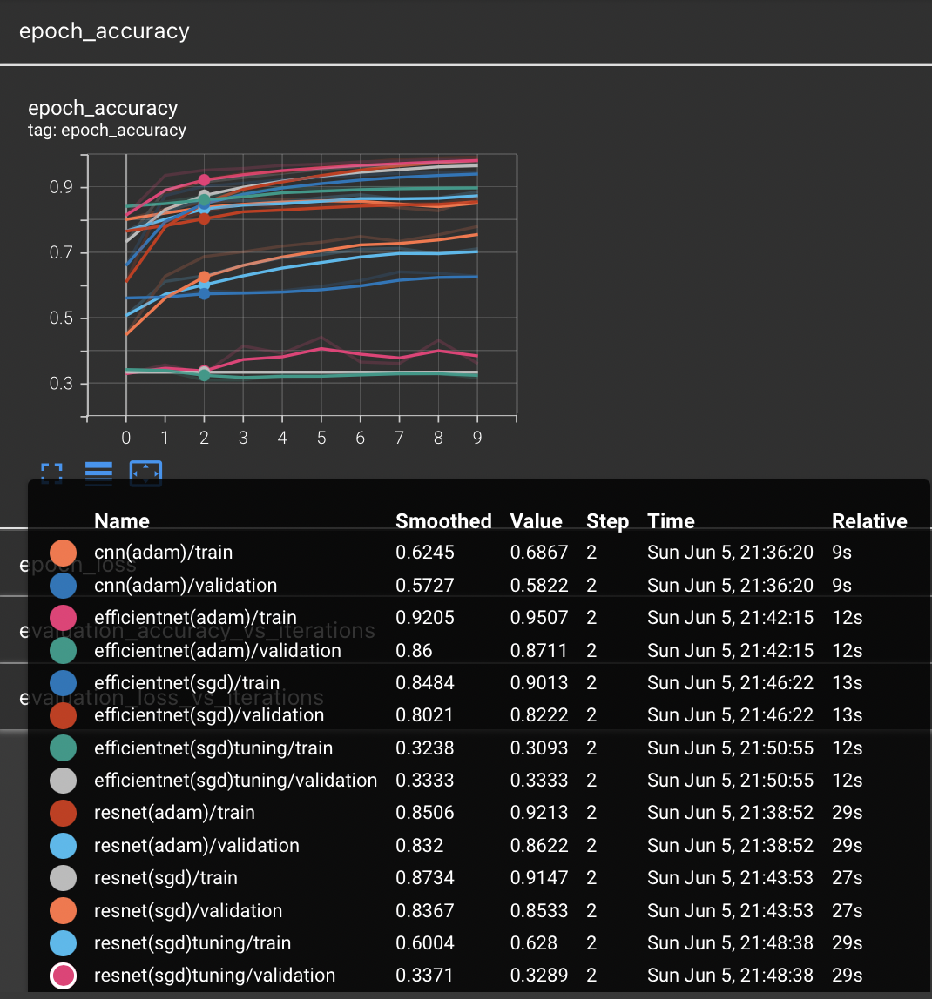

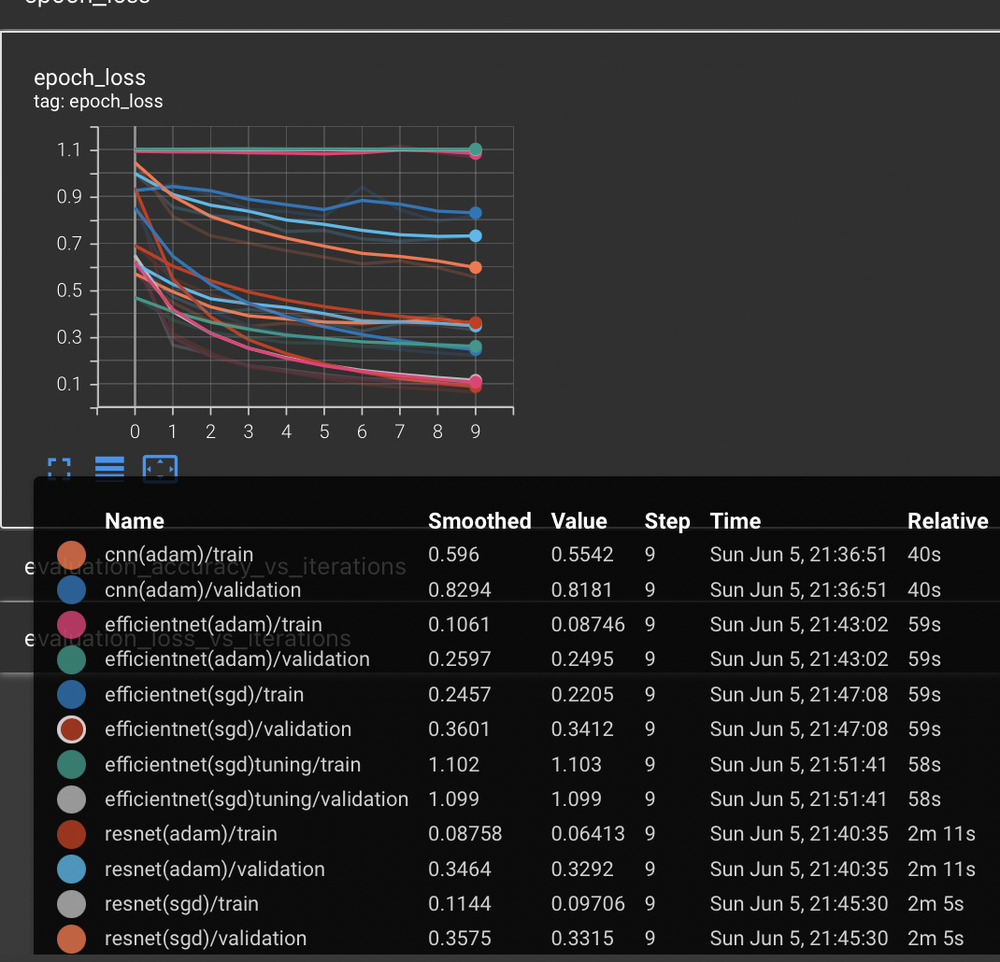

Висновок

Під час лабороторної роботи ми брали нейронну модель з інтернету, яка вже натренирована. Були три різні моделі з різними оптимізаторами. Перша - CNN з попередньої роботи. Друга - ResNet з оптимізацією Adam, GSD і також fine-tuning з 10 останніми шарами. Теж саме було пророблено й з моделью EfficientNet. Після того, як ми натренували наші моделі під наші вхідні дані ми зробили графіки по кожній моделі. Дивлячись на графік можемо побачити, що найліпша модель ResNet з оптимізацією Adam. Найгіршою була з fine-tuning бо там було тільки 10 останніх шарів.

